In [1]:
import librosa
import matplotlib.pyplot as plt
import numpy as np

### Sound Waves visualized

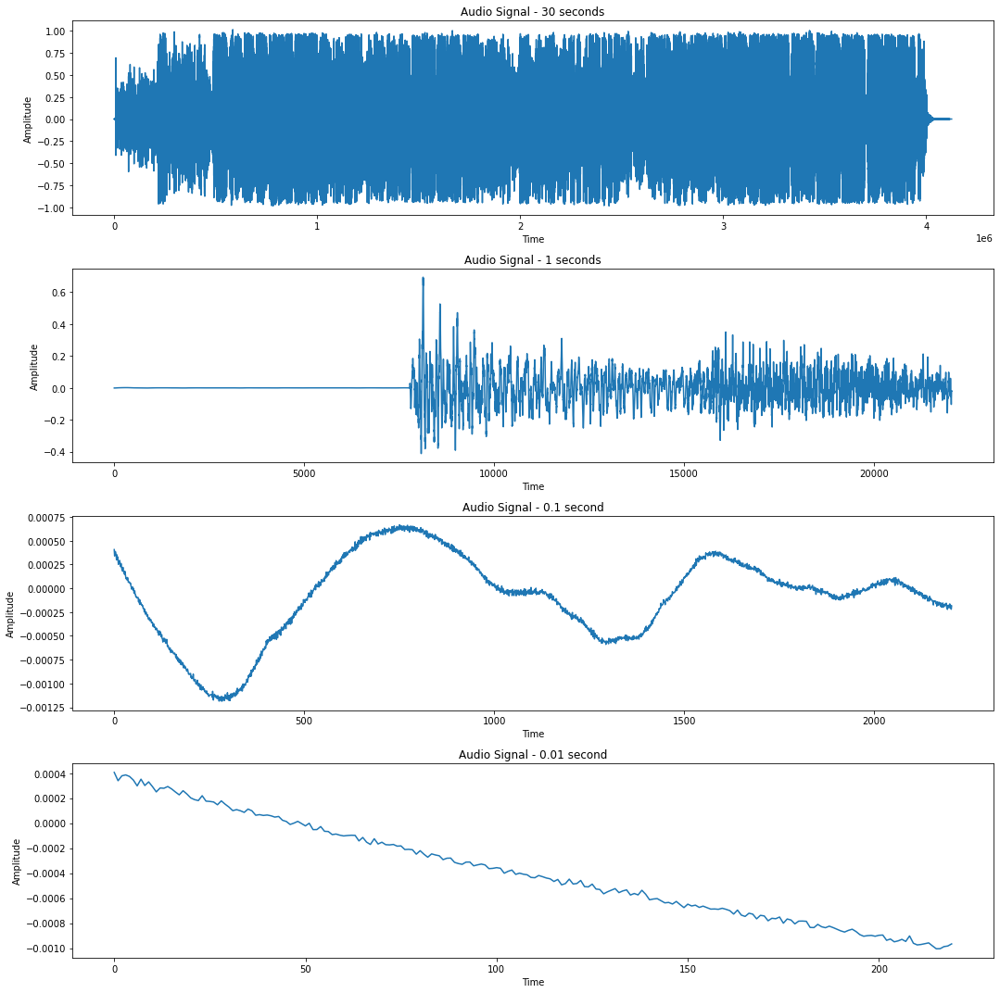

In [2]:
sound_sample_file = 'data/preview_test.mp3'

# load sound file with librosa
signal, sample_rate = librosa.load(sound_sample_file)

#plot 30 second sample
fig, ax = plt.subplots(nrows=4, figsize=(15,15))
ax[0].set_title('Audio Signal - 30 seconds')
ax[0].set_ylabel('Amplitude')
ax[0].set_xlabel('Time')
ax[0].plot(range(len(signal)), signal)

#plot 1 second sample
signal_sample = signal[:sample_rate]
ax[1].set_title('Audio Signal - 1 seconds')
ax[1].set_ylabel('Amplitude')
ax[1].set_xlabel('Time')
ax[1].plot(range(len(signal_sample)), signal_sample)

#plot 0.1 second sample
signal_short = signal[500:500+sample_rate//10]
ax[2].set_title('Audio Signal - 0.1 second')
ax[2].set_ylabel('Amplitude')
ax[2].set_xlabel('Time')
ax[2].plot(range(len(signal_short)), signal_short)

#plot 0.01 second sample
signal_short = signal[500:500+sample_rate//100]
ax[3].set_title('Audio Signal - 0.01 second')
ax[3].set_ylabel('Amplitude')
ax[3].set_xlabel('Time')
ax[3].plot(range(len(signal_short)), signal_short)

plt.tight_layout()
plt.show()

As we shorten the window of time on each subplot, we can see the signal of the audio much closer. Notice in the most magnified image of the signal the wave is a collection of different frequencies. There may be one low-frequency signal that combines with smaller high-frequency signals.

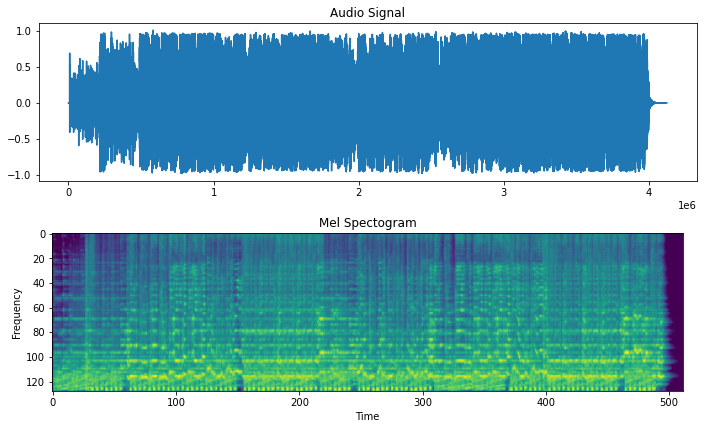

In [3]:
from skimage.transform import resize

signal, sr = librosa.load(sound_sample_file)
    
mels = librosa.power_to_db(librosa.feature.melspectrogram(y=signal, sr=sr, n_mels=128, fmax=8000), ref=np.max)
mel_image = (((80+mels)/80)*255)
mel_image = np.flip(mel_image, axis=0)
mel_image = resize(mel_image, (128,512)).astype(np.uint8)

# mfcc = librosa.power_to_db(librosa.feature.mfcc(y=signal, sr=sr, n_mfcc=128, fmax=8000), ref=np.max)
# mfcc_image = (((80+mfcc)/80)*255)
# mfcc_image = np.flip(mfcc_image, axis=0)
# mfcc_image = resize(mfcc_image, (128,512)).astype(np.uint8)

# chromagram = librosa.feature.chroma_cqt(y=signal, sr=sr)
# chroma_image = resize(chromagram*255, (128,512)).astype(np.uint8)

fig, ax = plt.subplots(nrows=2, figsize=(10,6))
ax[0].set_title('Audio Signal')
ax[0].plot(range(len(signal)), signal)
ax[1].set_title('Mel Spectogram')
ax[1].set_ylabel('Frequency')
ax[1].set_xlabel('Time')
ax[1].imshow(mel_image)
# ax[2].set_title('Mel Frequency Cepstral Coefficient')
# ax[2].imshow(mfcc_image)
# ax[3].set_title('Chromagram')
# ax[3].imshow(chroma_image)
plt.tight_layout()
plt.show()

# Project Pipeline

- Scrape song information from Spotify's Public API.
- Convert waveforms from mp3 previews to mel spectrograms.
- Train an autoencoder network to extract latent features from the audio information.
- Use UMAP for dimensionality reduction to view the latent space.
- Make recommendations based on cosine similarity in the latent space.
- Results and conclusions

# Initial EDA on Song Information

In [4]:
import pandas as pd
from pyarrow import feather

tracks_df = feather.read_feather('data/all_tracks.feather')
tracks_df = tracks_df.drop_duplicates(subset=['track_id']).reset_index(drop=True)
tracks_df['release_date'] = pd.to_datetime(tracks_df['release_date'],  errors='coerce', infer_datetime_format=True)
tracks_df['year'] = tracks_df['release_date'].dt.year
tracks_df.head()

,track_id,track_name,track_preview_link,track_popularity,track_uri,release_date,artist_name,artist_id,artist_genres,artist_popularity,year
0,5lRzWDEe7UuedU2QPsFg0K,The Funeral,https://p.scdn.co/mp3-preview/a3d4810ce9c8ea87...,73,spotify:track:5lRzWDEe7UuedU2QPsFg0K,2006-03-21,Band of Horses,0OdUWJ0sBjDrqHygGUXeCF,"[chamber pop, indie folk, indie rock, indietro...",59,2006
1,2IvNxLl01CTAfCOA103Tgx,No One's Gonna Love You,https://p.scdn.co/mp3-preview/69cbe47f7bc308d9...,65,spotify:track:2IvNxLl01CTAfCOA103Tgx,2007-10-09,Band of Horses,0OdUWJ0sBjDrqHygGUXeCF,"[chamber pop, indie folk, indie rock, indietro...",59,2007
2,766EIreId79ZFBkiDO1Ial,Our Swords,https://p.scdn.co/mp3-preview/6efb15544057d40a...,58,spotify:track:766EIreId79ZFBkiDO1Ial,2006-03-21,Band of Horses,0OdUWJ0sBjDrqHygGUXeCF,"[chamber pop, indie folk, indie rock, indietro...",59,2006
3,7fgOmdonXZap1Kuz7hs3O1,Is There A Ghost,https://p.scdn.co/mp3-preview/07598faa7d1520f7...,56,spotify:track:7fgOmdonXZap1Kuz7hs3O1,2007-10-09,Band of Horses,0OdUWJ0sBjDrqHygGUXeCF,"[chamber pop, indie folk, indie rock, indietro...",59,2007
4,6iYZuHW7IAUTvUpvRTVQZA,The Great Salt Lake,https://p.scdn.co/mp3-preview/3555806e3e4186a4...,55,spotify:track:6iYZuHW7IAUTvUpvRTVQZA,2006-03-21,Band of Horses,0OdUWJ0sBjDrqHygGUXeCF,"[chamber pop, indie folk, indie rock, indietro...",59,2006


In [5]:
tracks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 36927 entries, 0 to 36926
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   track_id            36927 non-null  object        
 1   track_name          36927 non-null  object        
 2   track_preview_link  28696 non-null  object        
 3   track_popularity    36927 non-null  int64         
 4   track_uri           36927 non-null  object        
 5   release_date        36927 non-null  datetime64[ns]
 6   artist_name         36927 non-null  object        
 7   artist_id           36927 non-null  object        
 8   artist_genres       36927 non-null  object        
 9   artist_popularity   36927 non-null  int64         
 10  year                36927 non-null  int64         
dtypes: datetime64[ns](1), int64(3), object(7)
memory usage: 3.1+ MB


In [6]:
tracks_df.isna().sum()

track_id                 0
track_name               0
track_preview_link    8231
track_popularity         0
track_uri                0
release_date             0
artist_name              0
artist_id                0
artist_genres            0
artist_popularity        0
year                     0
dtype: int64

In [7]:
missing_links = tracks_df[tracks_df.track_preview_link.isna()]
has_links = tracks_df[~tracks_df.track_preview_link.isna()]

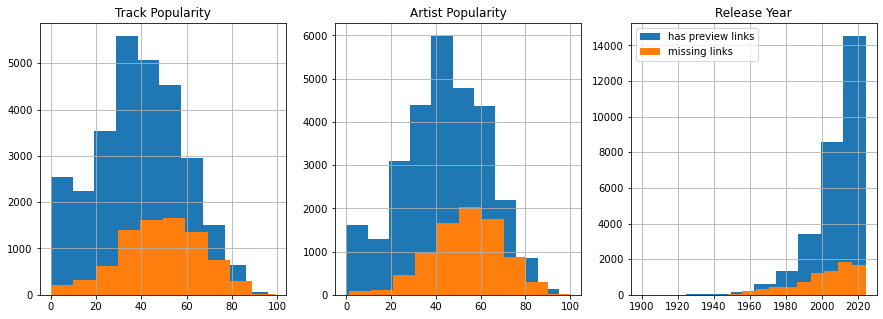

In [8]:
fig, ax = plt.subplots(ncols=3, figsize=(15,5))

ax[0].set_title('Track Popularity')
has_links.track_popularity.hist(ax=ax[0], label='has preview links')
missing_links.track_popularity.hist(ax=ax[0], label='missing links')

ax[1].set_title('Artist Popularity')
has_links.artist_popularity.hist(ax=ax[1], label='has preview links')
missing_links.artist_popularity.hist(ax=ax[1], label='missing links')

ax[2].set_title('Release Year')
has_links.year.hist(ax=ax[2], label='has preview links')
missing_links.year.hist(ax=ax[2], label='missing links')

plt.legend()

In [9]:
print('Has Preview Links - Mean Track Popularity:',round(tracks_df.track_popularity.mean(),2))
print('Missing Links - Mean Track Popularity:',round(missing_links.track_popularity.mean(),2))
print('')
print('Has Preview Links - Mean Artist Popularity:',round(tracks_df.artist_popularity.mean(),2))
print('Missing Links - Mean Artist Popularity:',round(missing_links.artist_popularity.mean(),2))

Has Preview Links - Mean Track Popularity: 41.18
Missing Links - Mean Track Popularity: 48.73

Has Preview Links - Mean Artist Popularity: 45.83
Missing Links - Mean Artist Popularity: 53.89


In [10]:
all_genres = set()
for idx, row in tracks_df.iterrows():
    for genre in row.artist_genres:
        all_genres.add(genre)
        
has_links_genres = dict.fromkeys(all_genres, 0)
for idx, row in has_links.iterrows():
    for genre in row.artist_genres:
        has_links_genres[genre] += 1
        
missing_links_genres = dict.fromkeys(all_genres, 0)
for idx, row in missing_links.iterrows():
    for genre in row.artist_genres:
        missing_links_genres[genre] += 1    

In [11]:
has_links_genres = {k: v for k, v in sorted(has_links_genres.items(), key=lambda item: item[1], reverse=True)}
print('Top 10 genres in tracks that have preview links:')
list(has_links_genres.items())[:10]

Top 10 genres in tracks that have preview links:


[('rock', 928),
 ('metal', 788),
 ('indietronica', 758),
 ('alternative rock', 687),
 ('alternative metal', 651),
 ('indie rock', 636),
 ('modern rock', 617),
 ('edm', 616),
 ('hard rock', 588),
 ('electro house', 575)]

In [12]:
missing_links_genres = {k: v for k, v in sorted(missing_links_genres.items(), key=lambda item: item[1], reverse=True)}
print('Top 10 genres in tracks that are missing preview links:')
list(missing_links_genres.items())[:10]

Top 10 genres in tracks that are missing preview links:


[('rock', 604),
 ('country', 344),
 ('pop', 326),
 ('hard rock', 309),
 ('modern rock', 309),
 ('movie tunes', 297),
 ('soul', 296),
 ('alternative metal', 288),
 ('country road', 282),
 ('classic rock', 267)]

# Training and Testing Images

In [13]:
import os
from random import sample
from PIL import Image

base_dir = 'data/Spotify/comp_pngs/'
sample_files = sample(os.listdir(base_dir),12)

images = []
for file in sample_files:
    images.append(Image.open(base_dir + file))

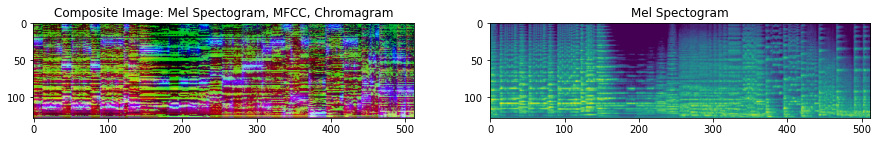

In [14]:
#plot composite image and mel spectorgram, side by side
fig, ax = plt.subplots(ncols=2, figsize=(15,3))
ax[0].set_title('Composite Image: Mel Spectogram, MFCC, Chromagram')
ax[0].imshow(np.array(images[0]))
ax[1].set_title('Mel Spectogram')
ax[1].imshow(np.array(images[0])[:,:,0])

Each mel spectrogram contains the frequency and time information for each track and we can see by looking at several examples together that their levels contain a wide range of different images.

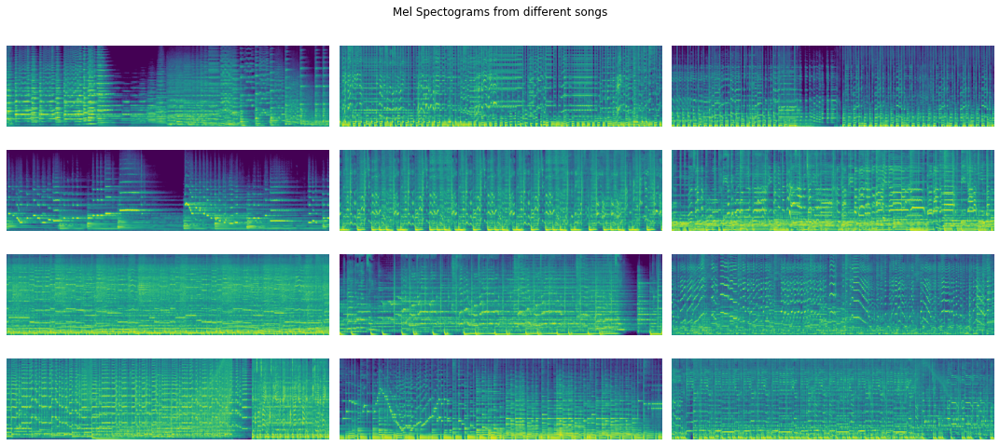

In [15]:
# plot mel spectograms
fig, ax = plt.subplots(ncols=3, nrows=4, figsize=(15,7))
plt.suptitle('Mel Spectograms from different songs')
for i, image in enumerate(images):
    ax[i // 3, i % 3].imshow(np.array(image)[:,:,0])
    ax[i // 3, i % 3].axis('off')
plt.tight_layout()
plt.show()

Each image is 512 pixels wide by 128 pixels tall. The neural network will only use images that are 128 by 128 pixels, so here are a few examples of how those slices will appear.

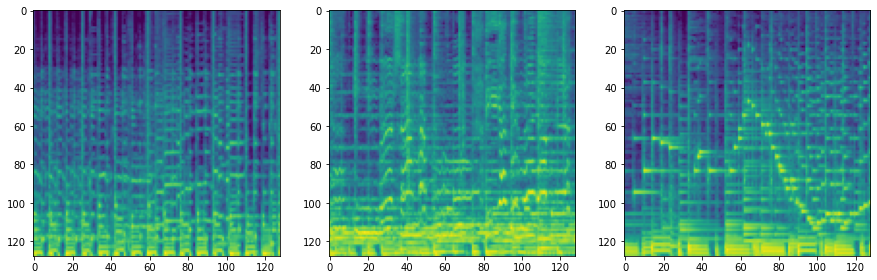

In [16]:
fig, ax = plt.subplots(ncols=3, figsize=(15,5))
ax[0].imshow(np.array(images[2])[:,:128,0])
ax[1].imshow(np.array(images[5])[:,:128,0])
ax[2].imshow(np.array(images[10])[:,:128,0])

In [17]:
!pip install spotipy


# Autoencoder Model

In [17]:
# import tensorflow
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D , Flatten, Reshape, Conv2DTranspose, BatchNormalization, Conv1D, Input
from tensorflow.keras import Model
from tensorflow.keras.optimizers import Adam

# import custom classes for data generators and saving the latent space after running inference on the entire set.
from src.DataGenerator import AudioDataGenerator
from src.LatentSpace import LatentSpace
from src.helper_functions import plot_reconstruction

In [18]:
# custom data generator initialization

data_gen = AudioDataGenerator(
    directory='data/Spotify/comp_pngs/', 
    image_size=(128,512), 
    color_mode='rgb',
    batch_size=32,
    sample_size=11000,
    shuffle=True,
    train_test_split=True, 
    test_size=0.02,
    output_channel_index=0,
    output_size=(128,128))


Found 10780 files for Training set
Found 220 files for Test set


In [19]:
img_width = 128
img_height = 128
num_channels=1
kernel_size = 5
strides = 2

In [25]:
# build the auto encoder

class Time_Freq_Autoencoder_Builder:
    
    def build(width, height, depth, filters=(32,64,128,256), latent_dim=256, kernel_size=5):
        
        strides = 2
        
        input_shape = (height, width, depth)
        inputs = Input(shape = input_shape)
        
        chan_dim = -1
        
        # input for x_time will be the original image, and x_freq will be the transpose of the image
        
        x_time = Reshape(target_shape=(height,width))(inputs)
        x_freq = Reshape(target_shape=(height,width))(tf.transpose(inputs, perm=[0,2,1,3]))
        
        # add Conv1d layers for time encoder
        
        for f in filters:
            
            x_time = Conv1D(f, kernel_size=kernel_size, strides=strides, padding='same', activation='relu')(x_time)
            x_time = BatchNormalization(axis=chan_dim)(x_time)
            
        # flatten and create a dense layers for half of the latent space dimensions, that will be concatenated with the freq encoder
            
        x_time = Flatten()(x_time)
        latent_time = Dense(latent_dim//2)(x_time)
        
        # add Conv1d layers for freq encoder
        
        for f in filters:
            
            x_freq = Conv1D(f, kernel_size=kernel_size, strides=strides, padding='same', activation='relu')(x_freq)
            x_freq = BatchNormalization(axis=chan_dim)(x_freq)
            
        # flatten and dense layer for frequency latent space
        
        x_freq = Flatten()(x_freq)
        latent_freq = Dense(latent_dim//2)(x_freq)
        
        # concatenate the two latent spaces from the two encoders
        
        latent_concat = tf.keras.layers.Concatenate(axis=1)([latent_time, latent_freq])
        
        # build encoder from layers
        
        encoder = Model(inputs, latent_concat, name='encoder')
        
        # build decoder
        
        latent_inputs = Input(shape=((latent_dim//2)*2))
        
        # reshape for expansion with Conv2dTranspose layers
        
        x = Dense(16384, activation='relu')(latent_inputs)
        x = Reshape(target_shape=(8,8,256))(x)
        
        # Conv2dTranspose layers
        
        for f in filters[::-1]:
            
            x = Conv2DTranspose(f, kernel_size=kernel_size, strides=strides, padding='same', activation='relu')(x)
            x = BatchNormalization(axis=chan_dim)(x)
            
        x = Conv2DTranspose(depth, kernel_size=kernel_size, padding='same', activation='sigmoid')(x)
        
        outputs = x
        
        # build decoder from layers
        
        decoder = Model(latent_inputs, outputs, name='decoder')
        
        # build autoencoder from encoder and decoder outputs
        
        autoencoder = Model(inputs, decoder(encoder(inputs)), name='autoencoder')
        
        return (encoder, decoder, autoencoder)
    

# custom Model class to build autoencoder    

class Time_Freq_Autoencoder(tf.keras.Model):
    
    def __init__(self, image_width, image_height, image_depth=1, latent_dim=256, kernel_size=5):
        super().__init__()
        
        self.encoder, self.decoder, self.autoencoder = Time_Freq_Autoencoder_Builder.build(width=image_width, height=image_height, depth=image_depth, latent_dim=256, kernel_size=kernel_size)
        
    def call(self, x):
        autoencoded = self.autoencoder(x)
        return autoencoded
    
autoencoder = Time_Freq_Autoencoder(image_width=img_width, image_height=img_height, latent_dim=256, kernel_size=5)

The model is trained with an Adam optimizer with a learning rate of .001, and mean squared error will be the loss function.

In [26]:
opt = Adam(learning_rate=1e-3)

autoencoder.compile(optimizer=opt, loss=tf.keras.losses.mse)

In [27]:
autoencoder.build(input_shape=(None,img_height,img_width,num_channels))

In [28]:
autoencoder.summary()

Model: "time__freq__autoencoder_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder (Functional)        (None, 256)               1000384   
                                                                 
 decoder (Functional)        (None, 128, 128, 1)       6927489   
                                                                 
 autoencoder (Functional)    (None, 128, 128, 1)       7927873   
                                                                 
Total params: 7,927,873
Trainable params: 7,924,993
Non-trainable params: 2,880
_________________________________________________________________


The model summary shows that the autoencoder is composed of the encoder and decoder.

If we look at the summary of the encoder, it might look a little confusing. The convolutional layers for each encoder are displayed next two each other, even though they are receiving and passing on totally different data.


In [29]:
autoencoder.encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 tf.compat.v1.transpose_1 (TFOp  (None, 128, 128, 1)  0          ['input_3[0][0]']                
 Lambda)                                                                                          
                                                                                                  
 reshape_3 (Reshape)            (None, 128, 128)     0           ['input_3[0][0]']                
                                                                                            

In [30]:
autoencoder.decoder.summary()

Model: "decoder"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 256)]             0         
                                                                 
 dense_5 (Dense)             (None, 16384)             4210688   
                                                                 
 reshape_5 (Reshape)         (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_5 (Conv2DT  (None, 16, 16, 256)      1638656   
 ranspose)                                                       
                                                                 
 batch_normalization_20 (Bat  (None, 16, 16, 256)      1024      
 chNormalization)                                                
                                                                 
 conv2d_transpose_6 (Conv2DT  (None, 32, 32, 128)      8193

We have already trained the model previously for 20 epochs and reached a mean squared error of 0.0037. Since we have already trained the model, we will load the weights in.

In [31]:
# hist = autoencoder.fit(data_gen.train,
#                        batch_size=data_gen.batch_size,
#                        epochs=20,
#                        validation_data=data_gen.test)

In [32]:
# load model

autoencoder_path = 'data/autoencoder_256dim_time_freq_128k_20epochs'
#autoencoder.save(autoencoder_path)
autoencoder = tf.keras.models.load_model(autoencoder_path)

We can test the model's ability to reconstruct an image. The left image is the original input and the middle image is the output. The image on the right is an illustration of the loss between the input and the output. The red and blue sections are parts of the image that the model is not reconstructing.

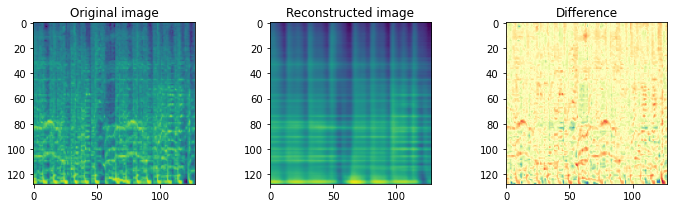

In [33]:
test_img = data_gen.take(1)[0]
prediction = autoencoder(test_img)

plot_reconstruction(test_img, prediction, 1)

# Build Latent Space from Encoder

In [34]:
from src.LatentSpace import LatentSpace

latent_space = LatentSpace(autoencoder_path=autoencoder_path,
                        image_dir='data/Spotify/comp_pngs/',
                        tracks_feather_path='data/all_tracks.feather',
                        latent_dims=256,
                        output_size=(128, 128),
                        num_tiles=64)

Found 22326 files for Generator set


In [35]:
# latent_space.build()
# latent_space.save(autoencoder_path)

In [36]:
latent_space.load(autoencoder_path)

Loaded tracks.
Loaded artists.
Loaded genres.
loaded scaler


In [37]:
latent_space.tracks.head()

,id,filename,latent_0,latent_1,latent_2,latent_3,latent_4,latent_5,latent_6,latent_7,...,track_id,track_name,track_preview_link,track_popularity,track_uri,release_date,artist_name,artist_id,artist_genres,artist_popularity
0,000ETNHKRNLHNPjsCojYkc,000ETNHKRNLHNPjsCojYkc.png,0.721291,-0.597413,0.286821,-0.371517,0.648350,1.215184,1.484203,-0.197143,...,000ETNHKRNLHNPjsCojYkc,Wargod,https://p.scdn.co/mp3-preview/c4ad0f791b667a3c...,39,spotify:track:000ETNHKRNLHNPjsCojYkc,2023-05-26,Immortal,2mVTkiwfm4ic6DnHpmFq8K,"[black metal, metal, norwegian black metal, no...",44
1,000xQBsBOXGbHzbOwWsTua,000xQBsBOXGbHzbOwWsTua.png,-1.318282,1.960487,0.454707,2.100340,4.054854,-1.738446,-1.584073,1.139075,...,000xQBsBOXGbHzbOwWsTua,Harmony in Blue I,https://p.scdn.co/mp3-preview/fc16dfe7516e143c...,42,spotify:track:000xQBsBOXGbHzbOwWsTua,2006-10-16,Tim Hecker,1qiwaJwjKod5WhcYZ76O1B,"[ambient, art pop, canadian experimental, comp...",46
2,000xYdQfIZ4pDmBGzQalKU,000xYdQfIZ4pDmBGzQalKU.png,-1.023046,1.719186,-0.196177,0.265967,0.257350,1.149018,0.117995,-1.061136,...,000xYdQfIZ4pDmBGzQalKU,"Eu, Você, O Mar e Ela",https://p.scdn.co/mp3-preview/9eb6ac1af84a72ee...,68,spotify:track:000xYdQfIZ4pDmBGzQalKU,2016-11-04,Luan Santana,3qvcCP2J0fWi0m0uQDUf6r,"[arrocha, sertanejo, sertanejo universitario]",77
3,001UkMQHw4zXfFNdKpwXAF,001UkMQHw4zXfFNdKpwXAF.png,0.352960,-0.392795,1.088642,-0.748757,0.778894,0.025233,0.979556,-1.168061,...,001UkMQHw4zXfFNdKpwXAF,Brand New Man - with Luke Combs,https://p.scdn.co/mp3-preview/e9449494ed78a684...,69,spotify:track:001UkMQHw4zXfFNdKpwXAF,2019-04-05,Brooks & Dunn,0XKOBt59crntr7HQXXO8Yz,"[contemporary country, country, country road]",68
4,005drRcJJFgFHgtxSJJO0v,005drRcJJFgFHgtxSJJO0v.png,-0.086014,-0.348173,0.477851,0.553625,0.568157,0.441359,0.982435,-0.945896,...,005drRcJJFgFHgtxSJJO0v,Fuck Everything,https://p.scdn.co/mp3-preview/5151d600ad5a5c44...,47,spotify:track:005drRcJJFgFHgtxSJJO0v,2012-06-19,Suicide Silence,6HZr7Fs2VfV1PYHIwo8Ylc,"[deathcore, melodic metalcore, metalcore, nu m...",52


In [38]:
latent_space.artists.head()

,artist_id,artist_name,latent_0,latent_1,latent_2,latent_3,latent_4,latent_5,latent_6,latent_7,...,latent_247,latent_248,latent_249,latent_250,latent_251,latent_252,latent_253,latent_254,latent_255,artist_popularity
0,00CEG7nPO88zFNuFL2Rz1L,Doctorfunk,0.372733,0.543497,0.298301,-0.108959,-0.377446,0.187481,0.287247,-0.099697,...,-0.384767,0.157046,0.238270,0.083218,0.288621,-0.446101,-0.342388,-0.414676,0.064079,19.0
1,00GKBeeETPqODILsgCQWab,郭品超,0.032617,0.250021,-0.814103,0.164173,0.358719,-0.363095,-0.395797,-0.298620,...,-0.149775,-1.144701,-1.017250,-0.948125,-0.900532,1.213076,1.203136,1.077410,0.537419,3.0
2,00J3XSB6tD4SGSFflGseDx,Reza Sadeghi,-0.456133,-0.042527,-0.443630,-0.094852,0.630386,0.102688,-0.349407,-0.028487,...,0.486595,0.303009,0.236041,0.295710,-0.047980,-0.043741,-0.057569,-0.119360,0.080385,37.0
3,00sAT5YX8W3xNd1EuqyHw9,Dada Life,0.154205,0.694474,0.404224,0.019546,-0.667485,0.074919,0.286692,-0.063932,...,-0.419203,0.077549,-0.150754,-0.184604,0.174593,0.090899,0.023115,0.184786,0.344830,48.0
4,00sazWvoTLOqg5MFwC68Um,Yann Tiersen,0.642600,1.587409,0.803742,0.414845,0.335402,-0.465862,0.173770,-0.611669,...,1.438790,-0.648013,-0.381386,0.049710,-0.891975,0.126893,0.098489,0.340817,-0.203056,64.0


In [39]:
latent_space.genres.head()

,genre,latent_0,latent_1,latent_2,latent_3,latent_4,latent_5,latent_6,latent_7,latent_8,...,latent_248,latent_249,latent_250,latent_251,latent_252,latent_253,latent_254,latent_255,track_popularity,artist_popularity
0,abstract hip hop,0.209182,0.499525,-0.289347,-0.174171,-1.014793,0.292721,-1.210356,0.755456,-0.105922,...,0.244833,0.072538,0.340787,0.755901,0.363758,-0.176946,0.114057,-0.925407,22.800000,25.0
1,acid house,0.414300,0.168211,-0.293060,-0.302486,0.170674,-0.449970,-0.649493,0.882965,-0.231327,...,0.542171,0.391805,0.312909,0.473290,-0.431373,-0.583799,-0.569023,-0.664838,13.800000,16.0
2,acoustic cover,-0.675188,-0.895310,-0.058011,-0.553715,0.534925,-0.321146,-0.907009,1.026761,0.099106,...,0.348652,0.364125,0.446177,1.129685,-0.238348,-0.868546,-0.640380,-1.106872,30.375000,37.0
3,afrobeat,0.636906,-0.210035,0.389066,-0.307530,0.356175,-0.471508,0.506109,-0.607982,1.014476,...,-0.147551,-0.014502,0.031039,-0.246164,-0.129541,-0.017400,-0.008351,0.501684,15.000000,42.0
4,afrobeats,-0.037885,0.013130,-0.149509,0.610856,-0.395989,0.672737,-0.155808,0.023494,-0.131041,...,0.281896,0.256035,0.326903,0.622671,-0.201400,-0.265268,-0.169199,-0.121100,47.714286,60.0


# Latent Space EDA - The Sonic Landscape

In [37]:
!pip install umap-learn


In [40]:
import umap
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
from sklearn.cluster import KMeans
import umap.plot
from sklearn.cluster import MiniBatchKMeans
from pyarrow import feather
import matplotlib.pyplot as plt
import seaborn as sns

In [41]:
# isolate the data from only the latent columns for use in the UMAP transformer
data = latent_space.tracks[latent_space.latent_cols]

In [42]:
data

,latent_0,latent_1,latent_2,latent_3,latent_4,latent_5,latent_6,latent_7,latent_8,latent_9,...,latent_246,latent_247,latent_248,latent_249,latent_250,latent_251,latent_252,latent_253,latent_254,latent_255
0,0.721291,-0.597413,0.286821,-0.371517,0.648350,1.215184,1.484203,-0.197143,-1.419104,0.592830,...,0.246637,-1.401171,0.143911,-0.058934,-0.538517,-0.667820,-0.153557,0.165978,-0.040669,1.313532
1,-1.318282,1.960487,0.454707,2.100340,4.054854,-1.738446,-1.584073,1.139075,0.415338,0.418012,...,6.353452,-1.940030,-6.064352,-6.606058,-6.230986,-3.859280,6.289131,6.574017,6.764657,0.851127
2,-1.023046,1.719186,-0.196177,0.265967,0.257350,1.149018,0.117995,-1.061136,0.816085,-0.214415,...,0.241017,0.589041,-0.552602,0.025624,0.126203,-0.695582,0.279386,0.263063,0.177183,0.487600
3,0.352960,-0.392795,1.088642,-0.748757,0.778894,0.025233,0.979556,-1.168061,0.845483,1.365592,...,0.434726,-0.903391,-0.131068,-0.029541,-0.393660,-1.031760,-0.114242,0.421719,0.032109,1.403105
4,-0.086014,-0.348173,0.477851,0.553625,0.568157,0.441359,0.982435,-0.945896,-0.766292,0.890815,...,0.332242,-0.417616,-0.482408,0.066814,-0.249326,-0.679891,0.092546,0.263153,0.095365,1.252877
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22321,-1.487955,0.784035,-0.790786,-0.632657,-1.327348,-0.095333,-0.409800,-0.330823,0.329439,-0.355902,...,-0.263599,1.057561,0.699783,0.396153,0.521218,0.039709,-0.047079,-0.099068,-0.156972,-0.119958
22322,-1.241162,0.852004,-0.281335,-0.012566,0.018231,0.974009,-0.433862,-0.124258,-0.032671,0.057754,...,-0.063703,0.099304,0.390710,0.133458,-0.092928,-0.174958,-0.136326,0.324204,-0.047869,0.063328
22323,-0.983598,1.080126,-0.358737,-0.606101,-0.545404,0.093183,-0.600100,0.047843,-1.736309,-1.028867,...,-0.298268,0.010706,0.188122,0.312173,0.353740,0.968047,-0.041569,-0.397472,-0.393376,-0.061918
22324,-0.170502,0.031843,1.053007,-0.960821,0.653099,-0.071057,0.548974,-0.840032,0.552776,0.341548,...,0.274647,-1.255560,0.073961,-0.079444,-0.152097,0.322585,0.088578,0.064892,0.268312,1.004570


In [ ]:
# use UMAP to reduce the 256 dimension space into just 2 dimensions for all tracks
embedding = umap.UMAP(n_neighbors=500, min_dist=.5).fit_transform(data)

In [ ]:
np.save('data/embedding.npy', embedding)

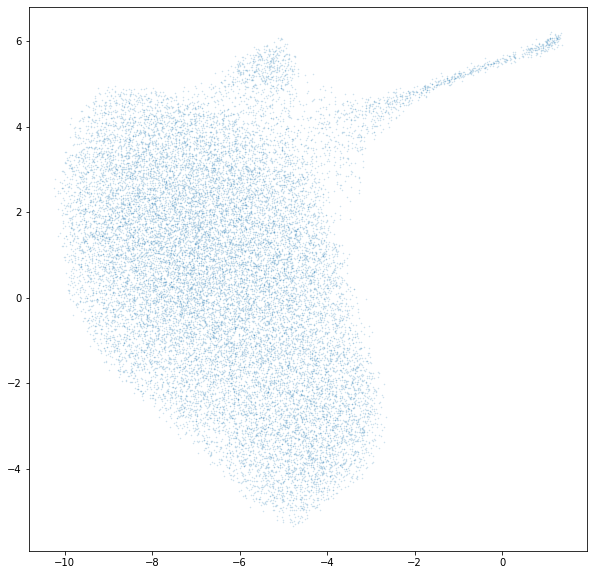

In [43]:
embedding = np.load('data/embedding.npy')
fig, ax = plt.subplots(1, figsize=(10, 10))
plt.scatter(*embedding.T, s=0.3, alpha=.2)

C:\Users\sahil\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


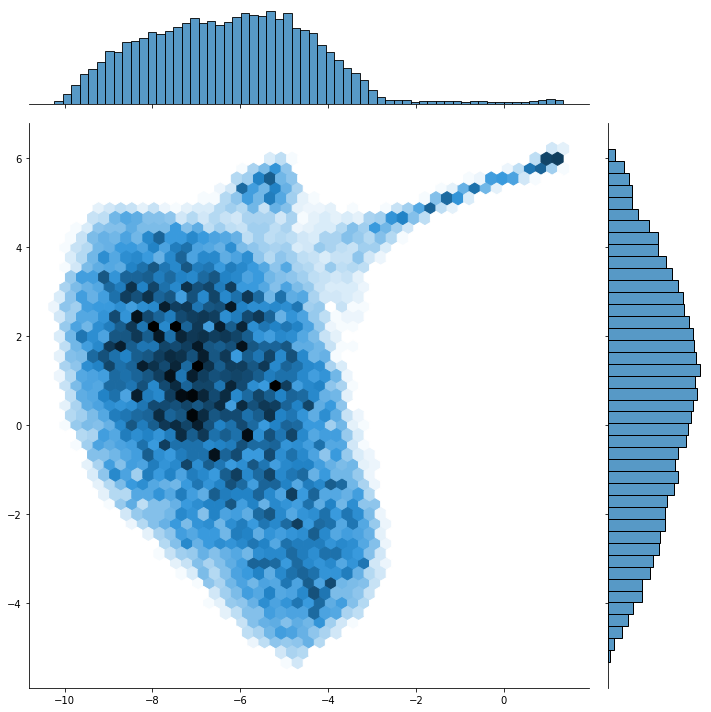

In [44]:
sns.jointplot(*embedding.T, kind='hex', height=10)


Using a low alpha, or the hex plot, we can already notice there are some clusters. Also the UMAP projection creates a well defined shape of all the tracks.

Now, we can use the same method to plot the genres' latent space.

In [45]:
from bokeh.resources import INLINE
import bokeh.io

bokeh.io.output_notebook(INLINE)

genre_map = umap.UMAP(n_neighbors=100, min_dist=.1).fit(latent_space.genres[latent_space.latent_cols])
genre_hover_data = pd.DataFrame(latent_space.genres.genre)
umap.plot.output_notebook()
p = umap.plot.interactive(genre_map, point_size=10, hover_data=genre_hover_data)
umap.plot.show(p)

Loading BokehJS ...

Loading BokehJS ...

TypeError: isinstance() arg 2 must be a type or tuple of types

I will try to find a approximate number of clusters with in the genres latent space using K-means clustering.

In [46]:

data_sample = latent_space.genres[latent_space.latent_cols]
results=[]
kmeans_predictions = []
gmm_predictions = []
for k in range(2,60):
    kmeans = MiniBatchKMeans(n_clusters=k).fit(data_sample)
    predict = kmeans.predict(data_sample)
    result = {
        'k':k,
        'inertia': kmeans.inertia_,
        'silhouette': silhouette_score(data_sample, predict),
    }
    results.append(result)
    kmeans_predictions.append(predict)
    print(result, end='\r')
cluster_results = pd.DataFrame(results)

C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


In [47]:
clusters = 9

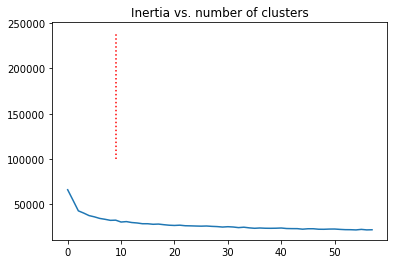

In [48]:
fig, ax = plt.subplots()
ax.set_title('Inertia vs. number of clusters')
cluster_results.inertia.plot(ax=ax)
ax.vlines(x=clusters, ymin=100000, ymax=240000, colors='red', linestyles='dotted')

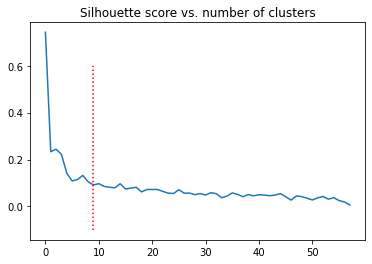

In [49]:
fig, ax = plt.subplots()
ax.set_title('Silhouette score vs. number of clusters')
cluster_results.silhouette.plot()
ax.vlines(x=clusters, ymin=-.1, ymax=.6, colors='red', linestyles='dotted')

Based on the inertia plot, we can try to determine the number of clusters by finding the elbow in the plot. In this plot the elbow is hard to see, so we will pick 10 clusters as an approximate number in the space.
Now, I can replot the genres' latent space with the clusters labeled by color.

In [45]:
genre_projected = latent_space.genres[latent_space.latent_cols].astype('float32')
kmeans_genre = MiniBatchKMeans(n_clusters=clusters).fit(genre_projected)
p = umap.plot.interactive(genre_map, labels = kmeans_genre.predict(genre_projected), point_size=10, hover_data=genre_hover_data)
umap.plot.show(p)

C:\Users\sahil\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1043: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


TypeError: isinstance() arg 2 must be a type or tuple of types

The K-Means clustering labels seem to make interesting clusters from the data.

My intuitions after analyzing the clusters:

 - light yellow: Death Metal, Hard Rock, Punk
 - crimson red: Electronic, Electronic Pop,
 - blue: Dance, House, Disco, 
 - light orange: Hip Hop, Techno, R&B
 - light green: Jazz, Indie Rock, Traditional,  Hip Hop
 - orange: Jazz, Salsa
 - red: Classical, Choir, Voice
 - turquoise: Classical Performance, Symphonic
 - purple: Piano, Individual Instruments, Ambient

We will predict the same clusters on all tracks and replot the projection with the same labeled clusters.

NameError: name 'kmeans_genre' is not defined

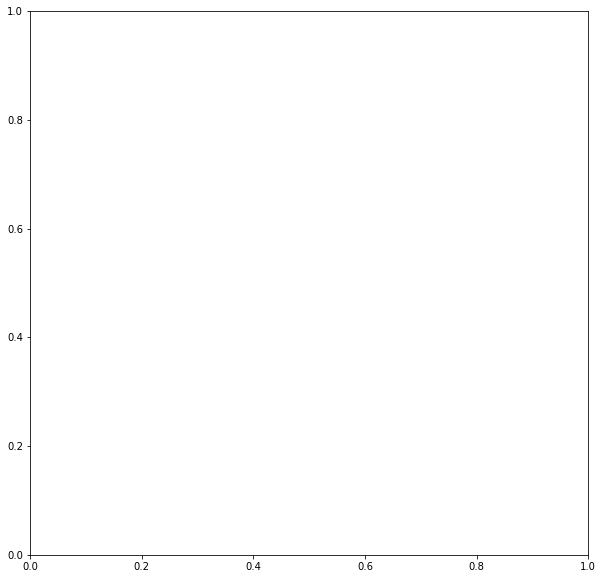

In [50]:
fig, ax = plt.subplots(1, figsize=(10, 10))
plt.scatter(*embedding.T, s=0.3, alpha=.2, c=kmeans_genre.predict(data), cmap='Spectral')
plt.savefig('img/tracks_clusters_umap.png')
plt.show()

# Get Recommendations

The custom LatentSpace class will search for recommendations using cosine similarity for each vector.

1. First, we will use the Spotify API to search a query.
2. The API will return the mp3 preview for the first result and run the mel spectrogram through the encoder.
3. Then we compare cosine similarity on the latent space columns of the entire track database.
4. Sort the result, and return the top ten highest scores.

![](img/Cosine_similarity.png)

In [51]:
import json
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

# using secret client_id and client_secret stored in json file
f = open('data/apikeys/apikeys.json')
apikeys = json.load(f)
client_id = apikeys['clientId']
client_secret = apikeys['clientSecret']

credentials_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)

# use spotipy to make a Spotify client
spotify = spotipy.Spotify(client_credentials_manager=credentials_manager)

In [52]:
query = 'kesariya'

In [54]:
# search Spotify
track = spotify.search(query)['tracks']['items'][0]

In [55]:
print(track['name'])
print(track['artists'][0]['name'])

Kesariya (From "Brahmastra")
Pritam


In [56]:
# save track_id and preview link
track_id = track['id']
link = track['preview_url']

In [57]:
# create mel spectogram and run through the encoder
vector = latent_space.get_vector_from_preview_link(link, track_id)
vector

,latent_0,latent_1,latent_2,latent_3,latent_4,latent_5,latent_6,latent_7,latent_8,latent_9,...,latent_246,latent_247,latent_248,latent_249,latent_250,latent_251,latent_252,latent_253,latent_254,latent_255
0,-0.132884,0.449396,0.865624,0.205604,0.488968,0.495842,-0.537902,-0.58311,0.595279,-1.173965,...,0.109776,0.915549,-0.157417,0.072157,0.499072,0.007027,0.588805,0.089239,0.235371,0.091253


In [58]:
# get recommendations from LatentSpace cosine similarity search
latents = latent_space.get_similarity(vector, latent_space.tracks, subset=latent_space.latent_cols, num=11)
latents = latents[~latents.track_name.apply(lambda x: x.lower()).isin([track['name'].lower()])][:10].reset_index()

In [60]:
# or, we can just use the LatentSpace class to create a dataframe of results
latent_space.search_for_recommendations(track['name'], num=10, get_time_and_freq=True)

Kesariya (From "Brahmastra")
Pritam
https://p.scdn.co/mp3-preview/767976462df41e836ac0d5bccfd528376c92d2ba?cid=776919162c6f4db1abd3e3bd4f58f134


,track_name,track_uri,artist_name,similarity,track_popularity,time_similarity,frequency_similarity
0,Kesariya,spotify:track:4UMIv5jd9gK98a39BQRD9X,Arijit Singh,0.978295,74,0.999934,0.908869
1,"Satranga (From ""Animal"")",spotify:track:0m5Hrrtn69vPbPbgZMH7kH,,0.667836,55,0.679569,0.625603
2,"Satranga (From ""ANIMAL"")",spotify:track:3yHyiUDJdz02FZ6jfUbsmY,Arijit Singh,0.667836,87,0.679569,0.625603
3,Imagine (feat. Jackson Wang & Tablo),spotify:track:5dREBNCLW6fqkY3y3KYRBq,Tablo,0.656496,43,0.650291,0.680317
4,Hiszékeny,spotify:track:10p1u69eVkCHe1rLwUyRqe,Venetian Snares,0.656434,25,0.575099,0.912418
5,Mouthful of Diamonds,spotify:track:6zO0e11RCBnh1w8kjPZpIh,Phantogram,0.651079,52,0.581780,0.856389
6,Tonight In Belfast - Edit,spotify:track:3Nc1xUyUx3tAXhylybt1u2,Orbital,0.648302,44,0.573323,0.891608
7,BB88,spotify:track:4PdVBteRApQTWQZmDukMM5,Khalil Fong,0.638795,43,0.578960,0.824804
8,Sudah,spotify:track:1MEvh0dfi2F9JR4ppGjI3J,Nidji,0.630532,49,0.619726,0.695195
9,Mileya Mileya,spotify:track:2IarWd16hKAvXU8vnEunVb,Sachin-Jigar,0.629793,70,0.591436,0.781494


Here are the recommendations based on our query 'Venus' by the band 'Television'.

We can see the cosine similarities for each track under the `similarity` column. Also, we can just get the similarities from the time encoder columns in `time_similarity` or the `frequency_similarity` encoder columns, in frequency_similarity.

Finally, we can transform the current track and its recommendations using a previously fit UMAP object, that was fit on the genre seeds from Spotify's API. These genres are the means of all the tracks that are tagged with each of these genres.


In [83]:
!pip install ploty_express
import plotly_express as px
import plotly.offline as pyo
pyo.init_notebook_mode()
from joblib import load

this_track_df = pd.DataFrame(vector, columns=latent_space.latent_cols)
this_track_df['name'] = track['name'] + ' - ' + track['artists'][0]['name']
this_track_df['label'] = 2

latents['name'] = latents['track_name'] + ' - ' + latents['artist_name']
latents['label'] = 1
latents = latents[['name'] + latent_space.latent_cols + ['label']]

base_genres = feather.read_feather('data/base_genres.feather')

genres_and_tracks = pd.concat([base_genres, latents, this_track_df]).reset_index(drop=True)
genre_map = load('data/genre_map.bin')
genre_map_trans = genre_map.transform(genres_and_tracks[latent_space.latent_cols])

genre_map_df = pd.DataFrame(genre_map_trans, columns=['x','y'])
genre_map_df = pd.concat([genres_and_tracks[['name','label']], genre_map_df], axis=1)
genre_map_df.label = genre_map_df.label.map({0:'genre', 1:'similar song', 2:'this song'})
genre_map_df['annotation'] = genre_map_df.apply(lambda x: x['name'] if x['label'] == 'genre' else '', axis=1)

fig = px.scatter(genre_map_df, x='x', y='y', color='label', hover_name='name', size=[.5]*len(genre_map_df), width=800, height=600, text='annotation')
fig.show()

ERROR: Could not find a version that satisfies the requirement ploty_express (from versions: none)
ERROR: No matching distribution found for ploty_express


ModuleNotFoundError: No module named 'plotly_express'

Finally, we can see that the current track, as well as its recommendations, exists in a similar space in the projected UMAP plot. In this example, most of the recommendations are close to the rock genre. But like most recommendations, their cosine similarity in the full dimensions of the latent space may look different in the UMAP projection.